In [30]:
#Import the necessary packages and libraries.
import numpy as np
import math
import time
import cv2
print (cv2.__version__)
import matplotlib.pyplot as plt
import scipy.signal as signal


4.6.0


In [44]:
cap = cv2.VideoCapture(0) #Get a frame from capture device


#loop through every frame until close
while (True):
    ret, frame = cap.read() #It will return if video is captured  and the frame be an image

    #show image
    img = cv2.flip(frame, 1)
    img = cv2.flip(img, 0)
    
    cv2.imshow('Video Capture', img)
    
    if cv2.waitKey(0) & 0xFF ==ord('q'):
        break
        
        
cap.release()
cv2.destroyAllWindows()

In [8]:
fileName = 'output.avi'
imgSize =(640, 480)
frame_per_second =30.0
writer = cv2.VideoWriter(fileName, cv2.VideoWriter_fourcc(*'MJPG'), frame_per_second, imgSize)

cap=cv2.VideoCapture(0)
while(cap.isOpened()):
    ret, frame = cap.read()
    if ret == True:
        writer.write(frame)
        cv2.imshow('Video Capture', frame)
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
    else:
        break
        

cap.release()
writer.release()
cv2.destroyAllWindows()

In [49]:
fileName ='output.avi'

cap= cv2.VideoCapture(fileName)
while(cap.isOpened()):
    ret, frame = cap.read()
    if ret ==True:
        
        cv2.imshow('frame', frame)
        if cv2.waitKey(0) & 0xFF == ord('q'):
            break
    
    else:
        break
        
cap.release()
cv2.destroyAllWindows()

False

In [35]:
scaling_factorx=0.5
scaling_factory=0.5

cap = cv2.VideoCapture(0)
while(True):
    
    ret, frame =cap.read()
    
    ret = cap.set(cv2.CAP_PROP_FRAME_WIDTH, 320)
    ret = cap.set(cv2.CAP_PROP_FRAME_HEIGHT, 240)
    frame = cv2.resize(frame, None, fx=scaling_factorx, fy =scaling_factory, interpolation=cv2.INTER_AREA)
    
    img = frame
    
    cv2.imshow('Smaller window', img)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

    
cap.release()
cv2.destroyAllWindows()

In [11]:
cap = cv2.VideoCapture(0)
while(True):
    
    ret, frame =cap.read()
    
    img = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    
    cv2.imshow('Gray', img)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

    
cap.release()
cv2.destroyAllWindows()

In [4]:
def equalizeHistColor(frame):
    img=cv2.cvtColor(frame, cv2.COLOR_RGB2HSV)
    img[:,:,2] = cv2.equalizeHist(img[:,:,2])
    return cv2.cvtColor(img, cv2.COLOR_HSV2RGB)


cap = cv2.VideoCapture(0)
while(True):
    
    ret, frame =cap.read()
    
    img = equalizeHistColor(frame)
    
    cv2.imshow('Histogram', img)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

    
cap.release()
cv2.destroyAllWindows()

In [39]:
def WarpImage(frame):
    ax,bx=10.0,100
    ay,by=20.0,120
    img=np.zeros(frame.shape, dtype=frame.dtype)
    rows, cols=img.shape[:2]
    
    for i in range(rows):
        for j in range(cols):
            offset_x=int(ax*math.sin(2*math.pi*i/bx))
            offset_y=int(ay*math.cos(2*math.pi*j/by))
            if i+offset_y<rows and j+offset_x<cols:
                img[i,j] =frame[(i+offset_y)%rows,(j+offset_x)%cols]
            else:
                img [i,j] =0
                
    return img

def equalizeHistColor(frame):
    img=cv2.cvtColor(frame, cv2.COLOR_RGB2HSV)
    img[:,:,2] = cv2.equalizeHist(img[:,:,2])
    return cv2.cvtColor(img, cv2.COLOR_HSV2RGB)


cap = cv2.VideoCapture(0)
while(cap.isOpened()):
    
    ret, frame =cap.read()
    frame =cv2.resize(frame, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_AREA)
    
    if ret==1:
        img = equalizeHistColor(WarpImage(frame))
    else:
        img = equalizeHistColor(frame)
        
    cv2.imshow('Warped', img)
    if cv2.waitKey(1) & 0xFF==ord('q'):
        break
        
        
        
        
cap.release()
cv2.destroyAllWindows()

In [40]:
cap = cv2.VideoCapture(0)
ret, frame1 =cap.read()

prvs = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)
hsv= np.zeros_like(frame1)
hsv[...,1] = 255
while(1):
    ret, frame2 =cap.read()
    
    next= cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)
    flow= cv2.calcOpticalFlowFarneback(prvs, next, None, 0.5, 3, 15, 3, 5, 1.2, 0)
    mag, ang = cv2.cartToPolar(flow[...,0], flow[...,1])
    hsv[...,0] = ang*180/np.pi/2
    hsv[...,2] = cv2.normalize(mag, None, 0, 225, cv2.NORM_MINMAX)
    bgr = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
    prvs = next
    
    cv2.imshow('optical flow', bgr)
    if cv2.waitKey(2) & 0xFF == ord('q'):
        break
        
        
          
cap.release()
cv2.destroyAllWindows()  

In [2]:
videoFile = cv2.VideoCapture('Background_Video_file.avi')
backgroundSubtractor = cv2.createBackgroundSubtractorMOG2(varThreshold=32, detectShadows = False)

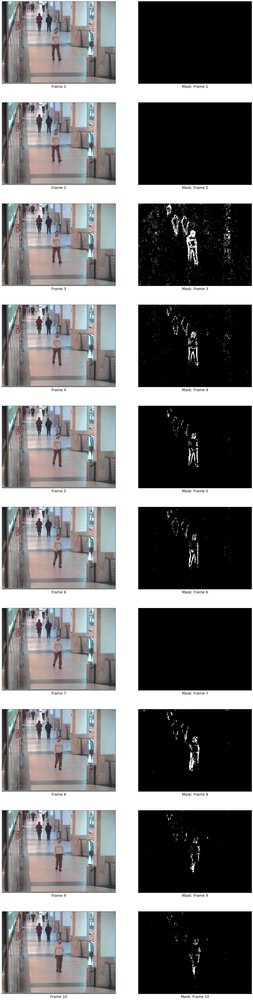

In [5]:
fig, axes =plt.subplots(10, 2 , figsize=(25, 100))

for i in range(10):
    _, frame=videoFile.read()
    mask = backgroundSubtractor.apply(frame)
    ax= axes[i, 0]
    ax.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('Frame {}'.format(i+1), fontsize =20)
    ax = axes[i, 1]
    ax.imshow(mask, cmap='gray')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('Mask: Frame {}'.format(i+1), fontsize =20)
plt.show()

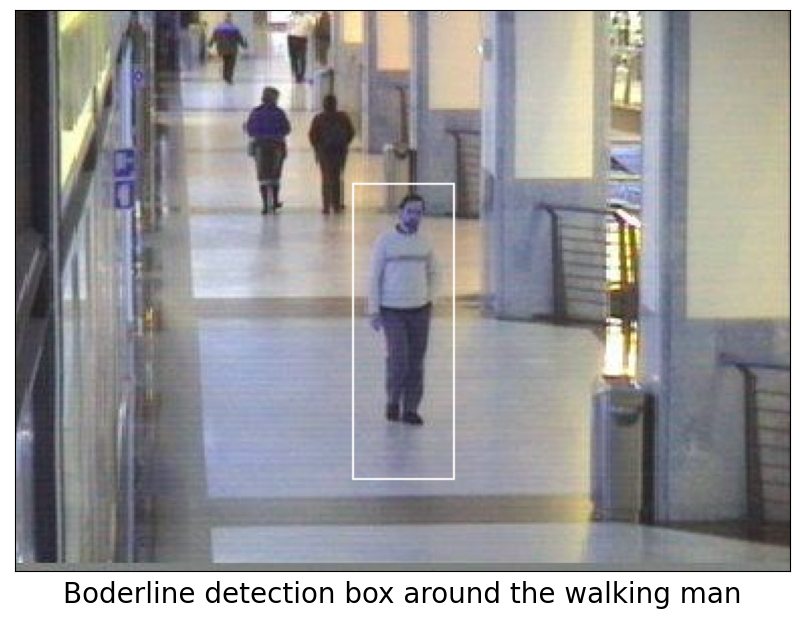

In [6]:
kernel = np.ones((5,5), np.uint8)
closing = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations = 3)
dilation = cv2.dilate(closing, kernel, iterations=3)
contours, _= cv2.findContours(dilation, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
largest_contours = contours[np.argmax([cv2.contourArea(c) for c in contours])]
x,y,w,h = cv2.boundingRect(largest_contours)
template = frame[y: y+h, x: x+w]
plt.figure(figsize=(10,12))
plt.imshow(cv2.rectangle(frame, (x,y), (x+w, y+h), (255, 255, 255),1 ))
plt.xlabel('Boderline detection box around the walking man', fontsize =20)
plt.xticks([])
plt.yticks([])
plt.show()

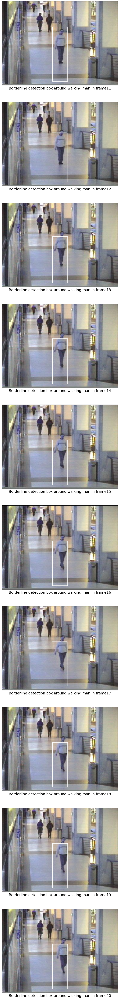

In [7]:
plt.figure(figsize=(15, 100))
for i in range(10):
    _, next_frame=videoFile.read()
    next_frame_gray = cv2.cvtColor(next_frame, cv2.COLOR_BGR2GRAY)
    template_gray = cv2.cvtColor(template,cv2.COLOR_BGR2GRAY )
    next_frame_gray = next_frame_gray - next_frame_gray.mean()
    template_gray = template_gray - template_gray.mean()
    corr = signal.correlate2d(next_frame_gray,template_gray, mode='same', boundary= 'symm' )
    y, x = np.unravel_index(np.argmax(corr), corr.shape)
    plt.subplot(10, 1, i+1)
    top_left= x- int(np.floor((w / 2)))
    bottom_left = y - int(np.floor((h / 2)))
    top_right= x+ int(np.floor((w / 2)))
    bottom_right= x + int(np.floor((h / 2)))
    template = next_frame[bottom_left: bottom_right, top_left: top_right]
    plt.imshow(cv2.rectangle(next_frame, (top_left, bottom_left), (top_right, bottom_right), (255,255,255), 1))
    plt.xticks([])
    plt.yticks([])
    plt.xlabel('Borderline detection box around walking man in frame{}'.format(i + 1 + 10), fontsize=20)
plt.show()
videoFile.release()

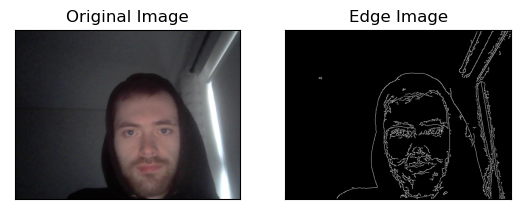

In [15]:
cap= cv2.VideoCapture(0)

ret, frame = cap.read()
frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        
plt.imshow(frame)

edges = cv2.Canny(frame,20,60)
plt.subplot(121),plt.imshow(frame,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
plt.show()
        
cap.release()

In [10]:
fileName = 'output.avi'
imgSize =(640, 480)
frame_per_second =30.0
writer = cv2.VideoWriter(fileName, cv2.VideoWriter_fourcc(*'MJPG'), frame_per_second, imgSize)

cap=cv2.VideoCapture(0)
while(cap.isOpened()):
    ret, frame = cap.read()
    edges = cv2.Canny(frame,20,60)
    if ret == True:
        writer.write(edges)
        cv2.imshow('Video Capture', edges)
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
    else:
        break
        

cap.release()
writer.release()
cv2.destroyAllWindows()

Edge detection is a technique used in image processing to identify points in a digital image where the brightness of pixels changes sharply. This is typically used to identify object boundaries in an image. There are several different techniques used for edge detection, but they all work by applying a mathematical algorithm to the pixel values in an image to identify locations where there is a sharp change in brightness. This change in brightness is interpreted as an edge in the image. Edge detection can be useful for a variety of tasks, such as object recognition and image segmentation.

In [55]:
cap = cv2.VideoCapture(0) #Get a frame from capture device


#loop through every frame until close
while (True):
    ret, frame = cap.read()

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # detect the edges in the image using the Canny edge detector
    edges = cv2.Canny(gray, 20, 60)

    # superimpose the edge detection mask onto the original image
    result = cv2.bitwise_and(frame, frame, mask=edges)

    # save the resulting image
    cv2.imshow('result.jpg', result)
    
    if cv2.waitKey(0) & 0xFF ==ord('q'):
        break
        
        
cap.release()
cv2.destroyAllWindows()

In [62]:
# Initialize the webcam
cap = cv2.VideoCapture(0)

while True:
    # Read frame from webcam
    ret, frame = cap.read()
    
    # Convert the frame to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    
    # Detect edges in the frame
    edges = cv2.Canny(gray, 50, 100)
    
    # Invert the edges
    edges = cv2.bitwise_not(edges)
    
    # Use the edges as a mask to superimpose the frame
    result = cv2.bitwise_and(frame, frame, mask=edges)
    
    # Display the resulting frame
    cv2.imshow('Edge Detection Mask', result)
    
    # Check if the user pressed 'q' to quit
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release the webcam
cap.release()

# Destroy all windows
cv2.destroyAllWindows()

In [18]:
# Import necessary modules
import cv2
import numpy as np

# Initialize the video capture object
cap = cv2.VideoCapture(0)

# Create a background subtractor object
mog = cv2.createBackgroundSubtractorMOG2()

while True:
    # Read the next frame from the video
    ret, frame = cap.read()

    # Apply the background subtractor to the frame
    mask = mog.apply(frame)

    # Invert the mask to create the foreground mask
    foreground_mask = cv2.bitwise_not(mask)

    # Use the mask to isolate the foreground objects
    foreground = cv2.bitwise_and(frame, frame, mask=foreground_mask)

    # Show the original frame and the foreground objects
    cv2.imshow("Original", frame)
    cv2.imshow("Foreground", foreground)

    # Check if the user pressed the 'q' key
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release the video capture object
cap.release()

# Destroy all windows
cv2.destroyAllWindows()
